# Imports

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.preprocessing import Imputer
from sklearn.decomposition import PCA
from sklearn import linear_model, decomposition, datasets
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
#from sklearn import cross_validation
from sklearn.metrics import confusion_matrix, roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn import preprocessing

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import tree
from sklearn import datasets, linear_model
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

# Read csv file

Data set Source from https://www.kaggle.com/arjhbholu/airline-dataset-mining

In [3]:
airlineData = pd.read_csv('Airline-Dataset.csv')
airlineData.head()
airlineData_orig = airlineData

# Getting to know columns & Selecting required features

In [4]:
# Getting column names
column_names = airlineData.columns
print(column_names)

Index(['Unnamed: 0', 'airline_name', 'author', 'author_country', 'content',
       'cabin_flown', 'overall_rating', 'seat_comfort_rating',
       'cabin_staff_rating', 'food_beverages_rating',
       'inflight_entertainment_rating', 'value_money_rating', 'Month', 'Year',
       'recommended'],
      dtype='object')


In [5]:
# Create list comprehension of the columns you want to lose
columns_to_drop = [column_names[i] for i in [0, 2, 12]] # remove 'Unnamed: 0', 'author', 'Month'
# Dropping unwanted columns
airlineData.drop(columns_to_drop, inplace=True, axis=1)

In [6]:
airlineData.columns

Index(['airline_name', 'author_country', 'content', 'cabin_flown',
       'overall_rating', 'seat_comfort_rating', 'cabin_staff_rating',
       'food_beverages_rating', 'inflight_entertainment_rating',
       'value_money_rating', 'Year', 'recommended'],
      dtype='object')

In [7]:
# checking data types of columns
airlineData.dtypes

airline_name                      object
author_country                    object
content                           object
cabin_flown                       object
overall_rating                   float64
seat_comfort_rating              float64
cabin_staff_rating               float64
food_beverages_rating            float64
inflight_entertainment_rating    float64
value_money_rating               float64
Year                               int64
recommended                        int64
dtype: object

# Checking null/missing values

In [8]:
# checking nulls
airlineData.isnull().sum()

airline_name                     0
author_country                   0
content                          0
cabin_flown                      0
overall_rating                   0
seat_comfort_rating              0
cabin_staff_rating               0
food_beverages_rating            0
inflight_entertainment_rating    0
value_money_rating               0
Year                             0
recommended                      0
dtype: int64

# Getting to know the airlineData dataframe 

In [9]:
airlineData.describe()

,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,Year,recommended
count,27284.000000,27284.000000,27284.000000,27284.000000,27284.000000,27284.000000,27284.000000,27284.000000
mean,6.067879,3.259566,3.522944,3.016493,2.553108,3.411413,2013.692530,0.603870
std,3.216066,1.351689,1.460053,1.515096,1.696009,1.440927,0.999572,0.489101
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1970.000000,0.000000
25%,3.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2013.000000,0.000000
50%,7.000000,4.000000,4.000000,3.000000,3.000000,4.000000,2014.000000,1.000000
75%,9.000000,4.000000,5.000000,4.000000,4.000000,5.000000,2014.000000,1.000000
max,10.000000,5.000000,5.000000,5.000000,5.000000,5.000000,2015.000000,1.000000


In [10]:
airlineData.head()

,airline_name,author_country,content,cabin_flown,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,Year,recommended
0,adria-airways,Germany,Outbound flight FRA/PRN A319. 2 hours 10 min f...,Economy,7.0,4.0,4.0,4.0,0.0,4.0,2015,1
1,adria-airways,United States,Two short hops ZRH-LJU and LJU-VIE. Very fast ...,Business Class,10.0,4.0,5.0,4.0,1.0,5.0,2015,1
2,adria-airways,Switzerland,Flew Zurich-Ljubljana on JP365 newish CRJ900. ...,Economy,9.0,5.0,5.0,4.0,0.0,5.0,2014,1
3,adria-airways,Singapore,Adria serves this 100 min flight from Ljubljan...,Business Class,8.0,4.0,4.0,3.0,1.0,4.0,2014,1
4,adria-airways,Poland,WAW-SKJ Economy. No free snacks or drinks on t...,Economy,4.0,4.0,2.0,1.0,2.0,2.0,2014,0


In [11]:
airlineData.shape

(27284, 12)

# Covariance & Correlation of features

In [12]:
# Covariance Matrix
airlineData.cov()

,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,Year,recommended
overall_rating,10.343081,3.131338,3.642213,3.131234,2.288042,3.853208,-0.167488,1.373956
seat_comfort_rating,3.131338,1.827063,1.189771,1.128549,0.953044,1.376512,-0.073214,0.428596
cabin_staff_rating,3.642213,1.189771,2.131754,1.399871,0.908524,1.496718,-0.068468,0.506542
food_beverages_rating,3.131234,1.128549,1.399871,2.295517,1.291027,1.328001,-0.053243,0.428152
inflight_entertainment_rating,2.288042,0.953044,0.908524,1.291027,2.876445,0.992096,0.135213,0.305868
value_money_rating,3.853208,1.376512,1.496718,1.328001,0.992096,2.076270,-0.083666,0.540907
Year,-0.167488,-0.073214,-0.068468,-0.053243,0.135213,-0.083666,0.999144,-0.022106
recommended,1.373956,0.428596,0.506542,0.428152,0.305868,0.540907,-0.022106,0.239220


In [13]:
# Correlation Matrix
airlineData.corr()

,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,Year,recommended
overall_rating,1.000000,0.720325,0.775661,0.642614,0.419480,0.831487,-0.052101,0.873473
seat_comfort_rating,0.720325,1.000000,0.602862,0.551066,0.415727,0.706743,-0.054188,0.648296
cabin_staff_rating,0.775661,0.602862,1.000000,0.632819,0.366893,0.711426,-0.046915,0.709330
food_beverages_rating,0.642614,0.551066,0.632819,1.000000,0.502420,0.608298,-0.035157,0.577775
inflight_entertainment_rating,0.419480,0.415727,0.366893,0.502420,1.000000,0.405961,0.079759,0.368729
value_money_rating,0.831487,0.706743,0.711426,0.608298,0.405961,1.000000,-0.058089,0.767506
Year,-0.052101,-0.054188,-0.046915,-0.035157,0.079759,-0.058089,1.000000,-0.045218
recommended,0.873473,0.648296,0.709330,0.577775,0.368729,0.767506,-0.045218,1.000000


# Getting to know values of Airline Dataset

In [14]:
airlineData['cabin_flown'].unique()

array(['Economy', 'Business Class', 'Premium Economy', 'First Class'],
      dtype=object)

In [15]:
airlineData['overall_rating'].unique()

array([ 7., 10.,  9.,  8.,  4.,  5.,  2.,  3.,  1.,  6.])

In [16]:
airlineData['inflight_entertainment_rating'].unique()

array([0., 1., 2., 3., 4., 5.])

In [17]:
airlineData['value_money_rating'].unique()

array([4., 5., 2., 3., 1., 0.])

In [18]:
airlineData['Year'].unique()

array([2015, 2014, 2013, 2012, 2011, 1970])

In [19]:
airlineData['recommended'].unique()

array([1, 0])

# Plotting Airline Dataset

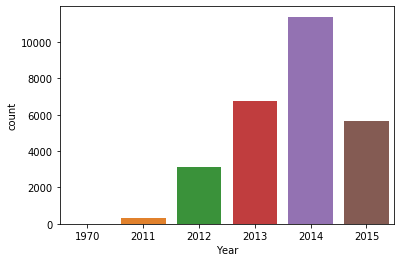

In [20]:
sns.countplot(x='Year',data=airlineData)

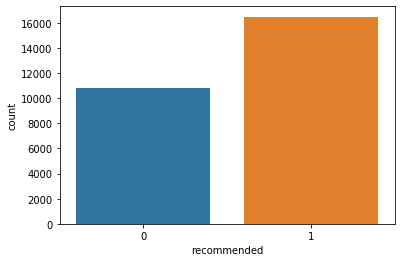

In [21]:
sns.countplot(x='recommended',data=airlineData)

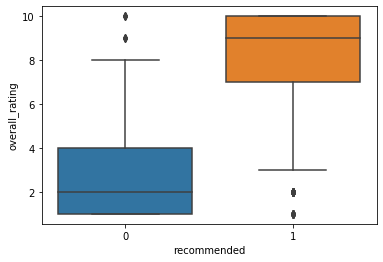

In [22]:
sns.boxplot(x='recommended',y='overall_rating',data=airlineData)

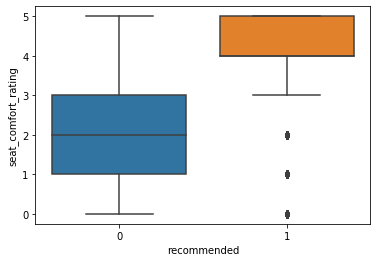

In [23]:
sns.boxplot(x='recommended',y='seat_comfort_rating',data=airlineData)

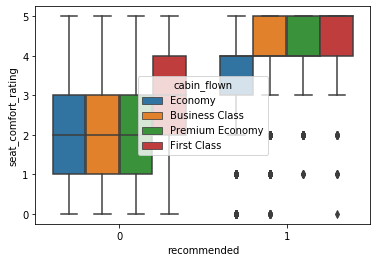

In [24]:
sns.boxplot(x='recommended',y='seat_comfort_rating',data=airlineData,hue='cabin_flown')

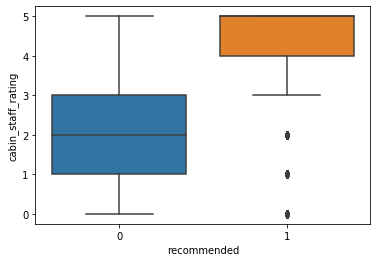

In [25]:
sns.boxplot(x='recommended',y='cabin_staff_rating',data=airlineData)

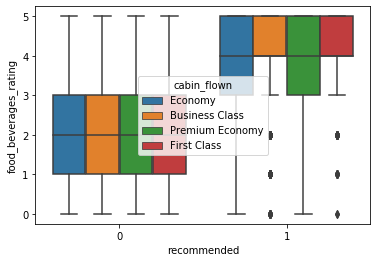

In [26]:
sns.boxplot(x='recommended',y='food_beverages_rating',data=airlineData,hue='cabin_flown')

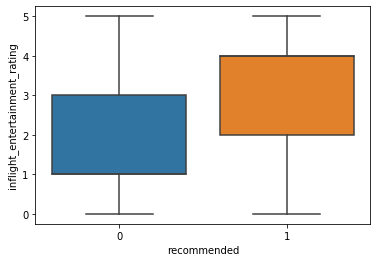

In [27]:
sns.boxplot(x='recommended',y='inflight_entertainment_rating',data=airlineData)

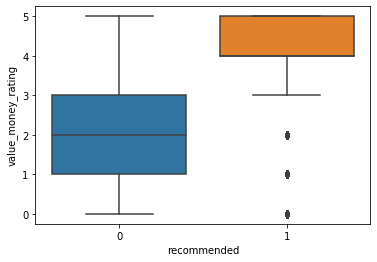

In [28]:
sns.boxplot(x='recommended',y='value_money_rating',data=airlineData)

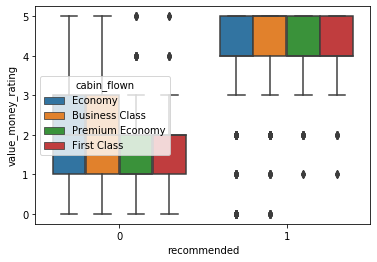

In [29]:
sns.boxplot(x='recommended',y='value_money_rating',data=airlineData,hue='cabin_flown')

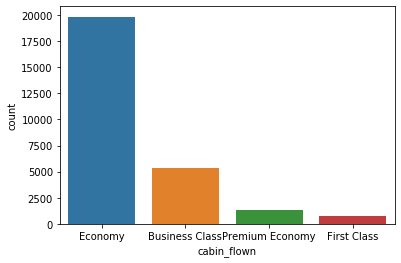

In [30]:
sns.countplot(x='cabin_flown',data=airlineData)

(array([3906., 2271., 1782., 1227., 1885., 1369., 2451., 3932., 4008.,
        4453.]),
 array([ 1. ,  1.9,  2.8,  3.7,  4.6,  5.5,  6.4,  7.3,  8.2,  9.1, 10. ]),
 <a list of 10 Patch objects>)

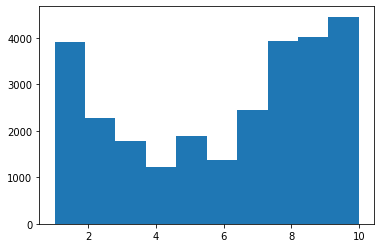

In [31]:
plt.hist(airlineData.overall_rating.values)

(array([10808.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 16476.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

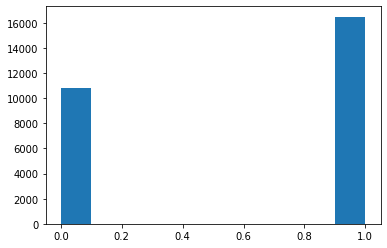

In [32]:
plt.hist(airlineData.recommended.values)

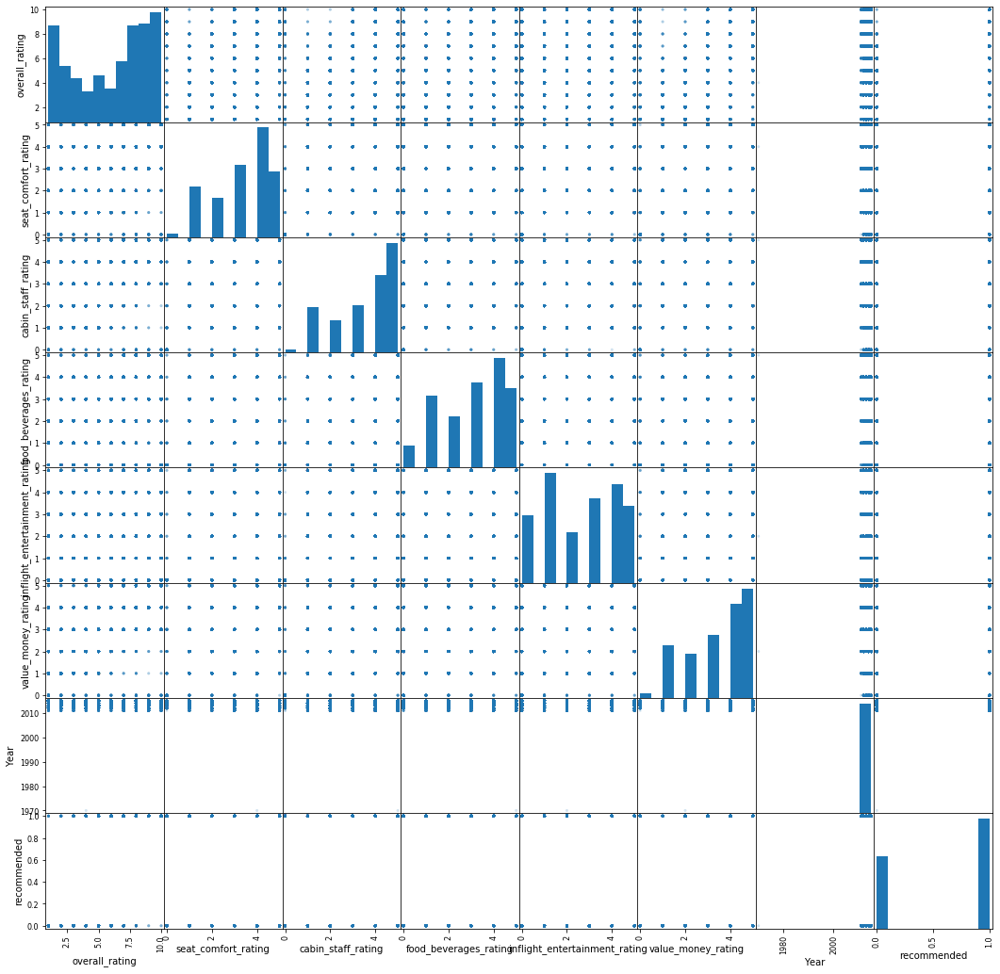

In [33]:
pd.plotting.scatter_matrix(airlineData, alpha=0.2, figsize=(18, 18))
plt.show()

# Data Pre- Processing

In [34]:
# Finding correlation of features with the target feature
airlineData.corr()["recommended"].sort_values(ascending=False)

recommended                      1.000000
overall_rating                   0.873473
value_money_rating               0.767506
cabin_staff_rating               0.709330
seat_comfort_rating              0.648296
food_beverages_rating            0.577775
inflight_entertainment_rating    0.368729
Year                            -0.045218
Name: recommended, dtype: float64

In [35]:
# Dropping unwanted/least correlated features
airlineData = airlineData_orig.drop(['author_country','content','Year'], axis=1)
airlineData

,airline_name,cabin_flown,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,recommended
0,adria-airways,Economy,7.0,4.0,4.0,4.0,0.0,4.0,1
1,adria-airways,Business Class,10.0,4.0,5.0,4.0,1.0,5.0,1
2,adria-airways,Economy,9.0,5.0,5.0,4.0,0.0,5.0,1
3,adria-airways,Business Class,8.0,4.0,4.0,3.0,1.0,4.0,1
4,adria-airways,Economy,4.0,4.0,2.0,1.0,2.0,2.0,0
...,...,...,...,...,...,...,...,...,...
27279,wizz-air,Economy,7.0,3.0,3.0,0.0,0.0,5.0,1
27280,wizz-air,Economy,2.0,1.0,3.0,3.0,0.0,2.0,0
27281,wizz-air,Economy,1.0,2.0,1.0,0.0,0.0,3.0,0
27282,wizz-air,Economy,5.0,3.0,4.0,2.0,1.0,4.0,1


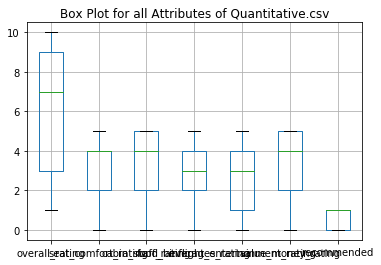

In [36]:
# Quantitative Dataframe Boxplot
boxplot = airlineData.boxplot()
plt.title("Box Plot for all Attributes of Quantitative.csv")
plt.show()

Since the dataset contains only ratings ranging from 0 to 10, there are no outlier data to be cleaned/ removed. Pre-processing data with Label Encoder and Min-Max normalization is done below.

In [38]:
# Data preprocessing 
airlineDataTemp = airlineData.iloc[:, :9]

le = preprocessing.LabelEncoder()
for column_name in airlineData.columns:
    if airlineData[column_name].dtype == object:
        airlineData[column_name] = le.fit_transform(airlineData[column_name])

# Normalizing data with min-max normalization
x = airlineData.iloc[:, :9].values
min_max_scaler = preprocessing.MinMaxScaler(feature_range=[0, 3]) # normalization range [0,3]
x_scaled = min_max_scaler.fit_transform(x)
dataNormalizedDf = pd.DataFrame(x_scaled, columns=airlineDataTemp.columns)
dataNormalizedDf

,airline_name,cabin_flown,overall_rating,seat_comfort_rating,cabin_staff_rating,food_beverages_rating,inflight_entertainment_rating,value_money_rating,recommended
0,0.000000,1.0,2.000000,2.4,2.4,2.4,0.0,2.4,3.0
1,0.000000,0.0,3.000000,2.4,3.0,2.4,0.6,3.0,3.0
2,0.000000,1.0,2.666667,3.0,3.0,2.4,0.0,3.0,3.0
3,0.000000,0.0,2.333333,2.4,2.4,1.8,0.6,2.4,3.0
4,0.000000,1.0,1.000000,2.4,1.2,0.6,1.2,1.2,0.0
...,...,...,...,...,...,...,...,...,...
27279,2.958763,1.0,2.000000,1.8,1.8,0.0,0.0,3.0,3.0
27280,2.958763,1.0,0.333333,0.6,1.8,1.8,0.0,1.2,0.0
27281,2.958763,1.0,0.000000,1.2,0.6,0.0,0.0,1.8,0.0
27282,2.958763,1.0,1.333333,1.8,2.4,1.2,0.6,2.4,3.0


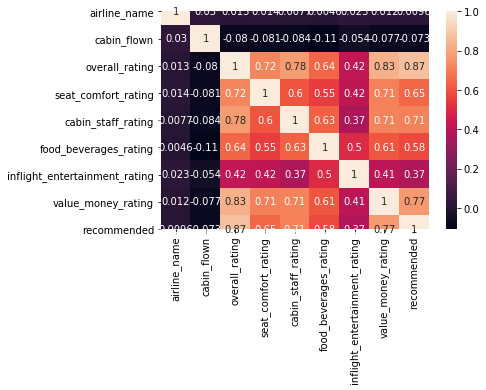

In [39]:
sns.heatmap(airlineData.corr(),annot=True)

# Classification Algorithms

# Splitting Data for Training & Testing Dataset

In [40]:
X = dataNormalizedDf.iloc[:, :-1].values
y = dataNormalizedDf['recommended'].values

# Applying Stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0, stratify=y)
print("Shape after split::", X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Shape after split:: (18280, 8) (9004, 8) (18280,) (9004,)


# Decision Trees

In [41]:
# Decision Tree with Entropy
dct = tree.DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=0)
dct = dct.fit(X_train, y_train)
scoreTrain =dct.score(X_train, y_train)
scoreTest = dct.score(X_test, y_test)
print("Decision Tree Classifier Model:::")
print("scoreTrain=", scoreTrain)
print("scoreTest=", scoreTest)

Decision Tree Classifier Model:::
scoreTrain= 0.9483041575492341
scoreTest= 0.9461350510884051


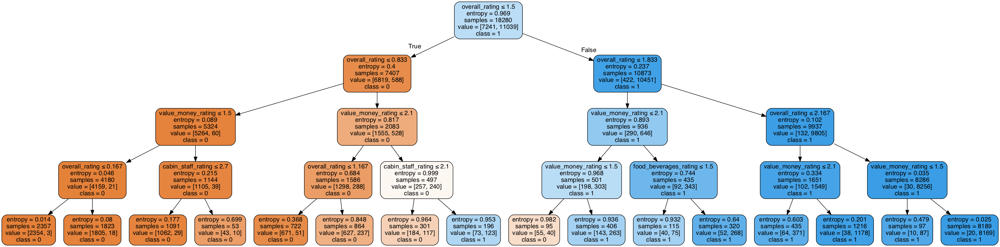

In [42]:
!pip install graphviz
!pip install pydotplus

from IPython.display import Image  
import pydotplus
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz

dot_data = StringIO()
export_graphviz(dct, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = airlineDataTemp.iloc[:,:-1].columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('airlineDct.png')
Image(graph.create_png())

In [43]:
# Predict
y_pred = dct.predict(X_test)

print("Accuracy of Decision Tree Classifier:",metrics.accuracy_score(y_test, y_pred))

Accuracy of Decision Tree Classifier: 0.9461350510884051


In [44]:
from sklearn.metrics import classification_report
print("Classification Report of Decision Tree Classifier Prediction model::")
print(classification_report(y_test,y_pred))

Classification Report of Decision Tree Classifier Prediction model::
              precision    recall  f1-score   support

         0.0       0.93      0.94      0.93      3567
         3.0       0.96      0.95      0.96      5437

    accuracy                           0.95      9004
   macro avg       0.94      0.94      0.94      9004
weighted avg       0.95      0.95      0.95      9004



Decision Tree 'Entropy' :::
    LevelLimit  Score for Training  Score for Testing
1          1.0            0.944748           0.940582
2          2.0            0.944748           0.940582
3          3.0            0.944748           0.940582
4          4.0            0.948304           0.946135
5          5.0            0.948687           0.945802
6          6.0            0.950492           0.942914
7          7.0            0.952516           0.943803
8          8.0            0.954923           0.944580
9          9.0            0.958698           0.942803
10        10.0            0.962637           0.939582
Decision Tree 'Gini' :::
    LevelLimit  Score for Training  Score for Testing
1          1.0            0.944748           0.940582
2          2.0            0.944748           0.940582
3          3.0            0.945241           0.943247
4          4.0            0.947155           0.944025
5          5.0            0.949562           0.943247
6          6.0            0.9

Text(0, 0.5, 'Score')

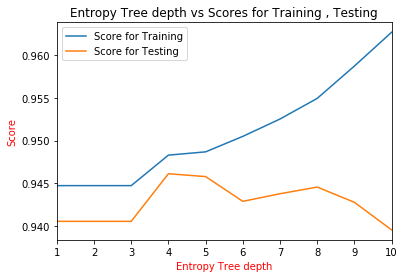

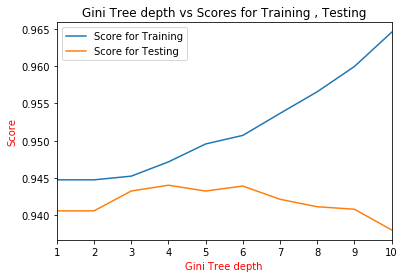

In [45]:
# Entropy with different depths from 1 to 10
resultsEntropy = pd.DataFrame(columns=['LevelLimit', 'Score for Training', 'Score for Testing'])
for treeDepth in range (1, 11):
    dct = tree.DecisionTreeClassifier(criterion='entropy', max_depth=treeDepth, random_state=0)
    dct = dct.fit(X_train, y_train)
    dct.predict(X_test)
    scoreTrain =dct.score(X_train, y_train)
    scoreTest = dct.score(X_test, y_test)
    resultsEntropy.loc[treeDepth] = [treeDepth, scoreTrain, scoreTest]

print("Decision Tree 'Entropy' :::")
print(resultsEntropy.head(11))
resultsEntropy.pop('LevelLimit')
ax = resultsEntropy.plot(title="Entropy Tree depth vs Scores for Training , Testing")
ax.set_xlabel("Entropy Tree depth", color="red")
ax.set_ylabel("Score", color="red")


# Gini index
resultsGini = pd.DataFrame(columns=['LevelLimit', 'Score for Training', 'Score for Testing'])
for treeDepth in range (1, 11):
    dct = tree.DecisionTreeClassifier(criterion='gini', max_depth=treeDepth, random_state=0)
    dct = dct.fit(X_train, y_train)
    dct.predict(X_test)
    scoreTrain =dct.score(X_train, y_train)
    scoreTest = dct.score(X_test, y_test)
    resultsGini.loc[treeDepth] = [treeDepth, scoreTrain, scoreTest]

print("Decision Tree 'Gini' :::")
print(resultsGini.head(11))
resultsGini.pop('LevelLimit')
ax = resultsGini.plot(title="Gini Tree depth vs Scores for Training , Testing")
ax.set_xlabel("Gini Tree depth", color="red")
ax.set_ylabel("Score", color="red")

# K-Fold on Decision Trees

In [46]:
# Cross Validation

# K-fold
from sklearn.model_selection import KFold # import KFold

kf = KFold(n_splits=2) # Define the split - into 2 folds 
kf.get_n_splits(X) # returns the number of splitting iterations in the cross-validator
print(kf)

KFold(n_splits=2, random_state=None, shuffle=False)


In [47]:
for train_index, test_index in kf.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)

TRAIN: [13642 13643 13644 ... 27281 27282 27283] TEST: [    0     1     2 ... 13639 13640 13641]
TRAIN: [    0     1     2 ... 13639 13640 13641] TEST: [13642 13643 13644 ... 27281 27282 27283]


In [48]:
# Cross Validation LOOCV
from sklearn.model_selection import LeaveOneOut 

loo = LeaveOneOut()
loo.get_n_splits(X)
for train_index, test_index in loo.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)
print(X_train, X_test, y_train, y_test)

TRAIN: [    1     2     3 ... 27281 27282 27283] TEST: [0]
TRAIN: [    0     2     3 ... 27281 27282 27283] TEST: [1]
TRAIN: [    0     1     3 ... 27281 27282 27283] TEST: [2]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15]
TRAIN: [    0     1     2 ... 27281 27282 27283] T

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [339]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [340]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [341]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [342]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [343]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [344]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [345]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [346]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [347]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [348]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [349]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [350]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [351]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [352]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [353]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [354]
TRAIN: [    0     1     

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [605]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [606]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [607]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [608]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [609]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [610]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [611]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [612]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [613]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [614]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [615]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [616]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [617]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [618]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [619]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [620]
TRAIN: [    0     1     

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [929]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [930]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [931]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [932]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [933]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [934]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [935]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [936]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [937]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [938]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [939]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [940]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [941]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [942]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [943]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [944]
TRAIN: [    0     1     

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1179]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1180]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1181]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1182]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1183]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1184]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1185]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1186]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1187]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1188]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1189]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1190]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1191]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1192]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1193]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1194]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1588]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1589]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1590]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1591]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1592]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1593]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1594]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1595]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1596]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1597]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1598]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1599]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1600]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1601]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1602]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1603]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1887]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1888]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1889]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1890]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1891]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1892]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1893]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1894]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1895]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1896]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1897]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1898]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1899]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1900]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1901]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [1902]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2174]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2175]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2176]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2177]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2178]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2179]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2180]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2181]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2182]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2183]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2184]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2185]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2186]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2187]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2188]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2189]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2431]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2432]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2433]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2434]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2435]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2436]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2437]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2438]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2439]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2440]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2441]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2442]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2443]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2444]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2445]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2446]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2838]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2839]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2840]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2841]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2842]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2843]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2844]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2845]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2846]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2847]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2848]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2849]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2850]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2851]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2852]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [2853]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3187]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3188]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3189]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3190]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3191]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3192]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3193]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3194]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3195]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3196]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3197]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3198]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3199]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3200]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3201]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3202]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3472]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3473]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3474]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3475]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3476]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3477]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3478]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3479]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3480]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3481]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3482]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3483]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3484]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3485]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3486]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3487]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3745]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3746]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3747]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3748]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3749]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3750]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3751]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3752]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3753]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3754]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3755]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3756]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3757]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3758]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3759]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [3760]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4110]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4111]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4112]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4113]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4114]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4115]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4116]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4117]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4118]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4119]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4120]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4121]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4122]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4123]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4124]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4125]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4427]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4428]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4429]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4430]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4431]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4432]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4433]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4434]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4435]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4436]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4437]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4438]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4439]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4440]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4441]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4442]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4717]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4718]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4719]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4720]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4721]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4722]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4723]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4724]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4725]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4726]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4727]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4728]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4729]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4730]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4731]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [4732]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5017]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5018]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5019]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5020]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5021]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5022]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5023]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5024]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5025]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5026]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5027]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5028]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5029]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5030]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5031]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5032]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5395]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5396]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5397]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5398]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5399]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5400]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5401]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5402]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5403]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5404]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5405]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5406]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5407]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5408]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5409]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5410]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5712]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5713]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5714]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5715]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5716]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5717]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5718]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5719]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5720]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5721]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5722]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5723]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5724]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5725]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5726]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [5727]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6020]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6021]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6022]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6023]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6024]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6025]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6026]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6027]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6028]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6029]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6030]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6031]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6032]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6033]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6034]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6035]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6317]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6318]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6319]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6320]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6321]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6322]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6323]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6324]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6325]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6326]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6327]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6328]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6329]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6330]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6331]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6332]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6689]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6690]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6691]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6692]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6693]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6694]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6695]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6696]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6697]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6698]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6699]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6700]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6701]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6702]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6703]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6704]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6961]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6962]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6963]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6964]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6965]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6966]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6967]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6968]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6969]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6970]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6971]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6972]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6973]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6974]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6975]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [6976]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7296]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7297]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7298]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7299]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7300]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7301]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7302]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7303]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7304]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7305]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7306]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7307]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7308]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7309]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7310]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7311]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7597]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7598]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7599]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7600]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7601]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7602]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7603]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7604]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7605]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7606]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7607]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7608]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7609]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7610]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7611]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7612]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7900]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7901]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7902]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7903]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7904]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7905]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7906]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7907]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7908]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7909]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7910]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7911]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7912]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7913]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7914]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [7915]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8211]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8212]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8213]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8214]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8215]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8216]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8217]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8218]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8219]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8220]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8221]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8222]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8223]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8224]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8225]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8226]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8487]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8488]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8489]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8490]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8491]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8492]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8493]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8494]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8495]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8496]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8497]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8498]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8499]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8500]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8501]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8502]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8755]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8756]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8757]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8758]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8759]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8760]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8761]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8762]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8763]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8764]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8765]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8766]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8767]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8768]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8769]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [8770]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9087]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9088]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9089]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9090]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9091]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9092]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9093]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9094]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9095]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9096]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9097]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9098]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9099]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9100]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9101]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9102]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9437]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9438]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9439]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9440]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9441]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9442]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9443]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9444]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9445]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9446]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9447]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9448]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9449]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9450]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9451]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9452]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9723]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9724]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9725]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9726]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9727]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9728]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9729]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9730]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9731]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9732]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9733]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9734]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9735]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9736]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9737]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9738]
TRAIN: [

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9996]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9997]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9998]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [9999]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10000]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10001]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10002]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10003]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10004]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10005]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10006]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10007]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10008]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10009]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10010]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [100

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10335]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10336]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10337]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10338]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10339]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10340]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10341]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10342]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10343]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10344]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10345]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10346]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10347]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10348]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10349]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10628]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10629]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10630]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10631]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10632]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10633]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10634]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10635]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10636]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10637]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10638]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10639]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10640]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10641]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10642]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10894]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10895]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10896]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10897]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10898]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10899]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10900]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10901]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10902]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10903]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10904]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10905]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10906]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10907]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [10908]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11116]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11117]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11118]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11119]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11120]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11121]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11122]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11123]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11124]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11125]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11126]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11127]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11128]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11129]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11130]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11459]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11460]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11461]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11462]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11463]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11464]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11465]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11466]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11467]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11468]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11469]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11470]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11471]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11472]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11473]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11731]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11732]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11733]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11734]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11735]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11736]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11737]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11738]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11739]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11740]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11741]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11742]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11743]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11744]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11745]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [11999]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12000]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12001]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12002]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12003]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12004]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12005]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12006]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12007]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12008]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12009]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12010]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12011]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12012]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12013]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12281]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12282]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12283]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12284]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12285]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12286]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12287]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12288]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12289]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12290]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12291]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12292]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12293]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12294]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12295]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12634]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12635]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12636]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12637]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12638]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12639]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12640]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12641]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12642]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12643]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12644]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12645]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12646]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12647]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12648]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12944]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12945]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12946]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12947]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12948]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12949]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12950]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12951]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12952]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12953]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12954]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12955]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12956]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12957]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [12958]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13239]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13240]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13241]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13242]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13243]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13244]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13245]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13246]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13247]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13248]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13249]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13250]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13251]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13252]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13253]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13467]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13468]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13469]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13470]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13471]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13472]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13473]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13474]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13475]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13476]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13477]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13478]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13479]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13480]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13481]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13833]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13834]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13835]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13836]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13837]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13838]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13839]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13840]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13841]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13842]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13843]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13844]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13845]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13846]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [13847]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14145]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14146]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14147]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14148]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14149]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14150]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14151]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14152]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14153]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14154]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14155]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14156]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14157]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14158]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14159]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14413]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14414]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14415]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14416]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14417]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14418]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14419]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14420]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14421]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14422]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14423]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14424]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14425]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14426]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14427]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14690]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14691]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14692]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14693]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14694]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14695]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14696]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14697]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14698]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14699]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14700]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14701]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14702]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14703]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [14704]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15083]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15084]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15085]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15086]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15087]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15088]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15089]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15090]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15091]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15092]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15093]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15094]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15095]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15096]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15097]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15419]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15420]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15421]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15422]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15423]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15424]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15425]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15426]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15427]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15428]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15429]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15430]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15431]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15432]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15433]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15674]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15675]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15676]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15677]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15678]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15679]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15680]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15681]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15682]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15683]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15684]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15685]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15686]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15687]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15688]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15943]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15944]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15945]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15946]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15947]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15948]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15949]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15950]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15951]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15952]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15953]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15954]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15955]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15956]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [15957]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16332]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16333]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16334]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16335]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16336]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16337]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16338]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16339]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16340]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16341]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16342]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16343]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16344]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16345]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16346]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16652]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16653]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16654]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16655]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16656]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16657]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16658]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16659]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16660]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16661]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16662]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16663]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16664]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16665]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16666]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16926]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16927]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16928]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16929]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16930]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16931]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16932]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16933]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16934]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16935]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16936]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16937]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16938]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16939]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [16940]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17165]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17166]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17167]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17168]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17169]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17170]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17171]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17172]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17173]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17174]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17175]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17176]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17177]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17178]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17179]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17548]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17549]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17550]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17551]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17552]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17553]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17554]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17555]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17556]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17557]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17558]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17559]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17560]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17561]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17562]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17832]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17833]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17834]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17835]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17836]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17837]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17838]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17839]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17840]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17841]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17842]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17843]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17844]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17845]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [17846]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18156]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18157]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18158]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18159]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18160]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18161]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18162]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18163]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18164]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18165]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18166]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18167]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18168]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18169]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18170]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18416]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18417]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18418]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18419]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18420]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18421]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18422]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18423]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18424]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18425]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18426]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18427]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18428]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18429]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18430]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18831]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18832]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18833]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18834]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18835]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18836]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18837]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18838]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18839]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18840]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18841]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18842]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18843]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18844]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [18845]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19140]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19141]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19142]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19143]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19144]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19145]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19146]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19147]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19148]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19149]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19150]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19151]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19152]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19153]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19154]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19420]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19421]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19422]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19423]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19424]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19425]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19426]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19427]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19428]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19429]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19430]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19431]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19432]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19433]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19434]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19672]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19673]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19674]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19675]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19676]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19677]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19678]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19679]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19680]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19681]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19682]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19683]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19684]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19685]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [19686]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20081]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20082]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20083]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20084]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20085]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20086]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20087]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20088]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20089]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20090]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20091]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20092]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20093]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20094]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20095]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20432]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20433]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20434]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20435]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20436]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20437]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20438]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20439]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20440]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20441]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20442]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20443]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20444]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20445]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20446]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20724]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20725]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20726]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20727]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20728]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20729]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20730]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20731]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20732]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20733]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20734]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20735]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20736]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20737]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20738]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20997]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20998]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [20999]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21000]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21001]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21002]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21003]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21004]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21005]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21006]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21007]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21008]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21009]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21010]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21011]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21367]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21368]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21369]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21370]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21371]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21372]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21373]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21374]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21375]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21376]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21377]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21378]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21379]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21380]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21381]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21643]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21644]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21645]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21646]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21647]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21648]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21649]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21650]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21651]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21652]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21653]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21654]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21655]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21656]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21657]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21955]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21956]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21957]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21958]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21959]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21960]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21961]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21962]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21963]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21964]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21965]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21966]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21967]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21968]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [21969]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22249]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22250]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22251]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22252]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22253]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22254]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22255]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22256]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22257]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22258]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22259]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22260]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22261]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22262]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22263]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22645]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22646]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22647]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22648]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22649]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22650]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22651]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22652]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22653]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22654]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22655]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22656]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22657]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22658]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22659]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22955]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22956]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22957]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22958]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22959]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22960]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22961]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22962]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22963]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22964]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22965]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22966]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22967]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22968]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [22969]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23295]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23296]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23297]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23298]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23299]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23300]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23301]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23302]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23303]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23304]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23305]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23306]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23307]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23308]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23309]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23602]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23603]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23604]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23605]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23606]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23607]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23608]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23609]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23610]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23611]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23612]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23613]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23614]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23615]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23616]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23953]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23954]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23955]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23956]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23957]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23958]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23959]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23960]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23961]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23962]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23963]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23964]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23965]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23966]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [23967]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24293]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24294]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24295]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24296]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24297]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24298]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24299]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24300]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24301]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24302]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24303]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24304]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24305]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24306]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24307]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24595]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24596]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24597]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24598]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24599]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24600]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24601]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24602]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24603]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24604]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24605]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24606]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24607]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24608]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24609]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24895]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24896]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24897]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24898]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24899]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24900]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24901]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24902]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24903]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24904]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24905]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24906]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24907]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24908]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [24909]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25306]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25307]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25308]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25309]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25310]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25311]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25312]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25313]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25314]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25315]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25316]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25317]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25318]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25319]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25320]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25579]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25580]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25581]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25582]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25583]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25584]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25585]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25586]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25587]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25588]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25589]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25590]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25591]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25592]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25593]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25878]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25879]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25880]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25881]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25882]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25883]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25884]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25885]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25886]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25887]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25888]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25889]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25890]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25891]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [25892]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26180]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26181]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26182]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26183]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26184]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26185]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26186]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26187]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26188]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26189]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26190]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26191]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26192]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26193]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26194]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26578]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26579]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26580]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26581]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26582]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26583]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26584]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26585]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26586]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26587]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26588]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26589]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26590]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26591]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26592]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26929]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26930]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26931]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26932]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26933]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26934]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26935]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26936]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26937]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26938]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26939]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26940]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26941]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26942]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [26943]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27223]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27224]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27225]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27226]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27227]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27228]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27229]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27230]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27231]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27232]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27233]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27234]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27235]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27236]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: [27237]
TRAIN: [    0     1     2 ... 27281 27282 27283] TEST: 

In [49]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics

# Perform 10-fold cross validation
scores = cross_val_score(dct, X, y, cv=10)
k = 1
for i in scores:
    print("K-Fold level = ", k , " Score = ", i)
    k=k+1

K-Fold level =  1  Score =  0.8937339684866251
K-Fold level =  2  Score =  0.929278123854892
K-Fold level =  3  Score =  0.9212165628435325
K-Fold level =  4  Score =  0.929278123854892
K-Fold level =  5  Score =  0.9384389886405277
K-Fold level =  6  Score =  0.9263466471234885
K-Fold level =  7  Score =  0.9226539589442815
K-Fold level =  8  Score =  0.8856304985337243
K-Fold level =  9  Score =  0.9251925192519251
K-Fold level =  10  Score =  0.8558855885588559


# Naive Bayes

In [50]:
from sklearn.naive_bayes import MultinomialNB
Nb_model = MultinomialNB()
Nb_model.fit(X_train,y_train)
MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [51]:
pred=Nb_model.predict(X_test)
pred

array([3., 0., 3., ..., 0., 3., 3.])

In [52]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,pred)

array([[2306, 1261],
       [ 142, 5295]])

In [53]:
from sklearn.metrics import accuracy_score 
accuracy_score(y_test,pred)

0.8441803642825411

In [54]:
from sklearn.model_selection import cross_val_score
score_nb=cross_val_score(Nb_model, X, y, cv=10, scoring='accuracy')
score_nb.mean()

0.8382716837969056

# Random Forest

In [55]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators=10,random_state=42,bootstrap=True)
RF_model.fit(X_train, y_train)
RF_model.score(X_test, y_test)

0.9404709018214127

In [56]:
rf_pred = RF_model.predict(X_test)

In [57]:
rf_cm = confusion_matrix(y_test, rf_pred)
rf_cm

array([[3339,  228],
       [ 308, 5129]])

In [58]:
!pip install pydot

from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydot

In [59]:
features=list(airlineDataTemp.iloc[:, :-1].columns)
features

['airline_name',
 'cabin_flown',
 'overall_rating',
 'seat_comfort_rating',
 'cabin_staff_rating',
 'food_beverages_rating',
 'inflight_entertainment_rating',
 'value_money_rating']

In [60]:
tree = RF_model.estimators_[5]
dot_data=StringIO()
export_graphviz(tree,out_file=dot_data,feature_names=features,class_names=['0','1'],filled=True,rounded=True,precision=1)
graph=pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png())

In [61]:
score_rf=cross_val_score(RF_model, X, y, cv=10, scoring='accuracy')
score_rf.mean()

0.9218535724008221

# SVM

In [62]:
df_cor= airlineData[['overall_rating','cabin_flown','seat_comfort_rating','cabin_staff_rating','food_beverages_rating','inflight_entertainment_rating','value_money_rating','recommended']]

In [63]:
X=df_cor[['overall_rating','cabin_flown','seat_comfort_rating','cabin_staff_rating','food_beverages_rating','inflight_entertainment_rating','value_money_rating']]
y=df_cor['recommended']

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)

In [65]:
from sklearn.svm import SVC
svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train)
y_pred = svclassifier.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix
print ('Linear Kernel Performance')
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))


Linear Kernel Performance
[[2988  217]
 [ 238 4743]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      3205
           1       0.96      0.95      0.95      4981

    accuracy                           0.94      8186
   macro avg       0.94      0.94      0.94      8186
weighted avg       0.94      0.94      0.94      8186



In [66]:
svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train)
y_pred = svclassifier.predict(X_test)

print ('Linear Kernel Performance')
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))


Linear Kernel Performance
[[2988  217]
 [ 238 4743]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      3205
           1       0.96      0.95      0.95      4981

    accuracy                           0.94      8186
   macro avg       0.94      0.94      0.94      8186
weighted avg       0.94      0.94      0.94      8186



In [67]:
g_svclassifier = SVC(kernel='rbf')
g_svclassifier.fit(X_train, y_train)
g_y_pred = g_svclassifier.predict(X_test)

print ('Gussain Kernel Performance')
print(confusion_matrix(y_test, g_y_pred))
print(classification_report(y_test, g_y_pred))

Gussain Kernel Performance
[[3002  203]
 [ 245 4736]]
              precision    recall  f1-score   support

           0       0.92      0.94      0.93      3205
           1       0.96      0.95      0.95      4981

    accuracy                           0.95      8186
   macro avg       0.94      0.94      0.94      8186
weighted avg       0.95      0.95      0.95      8186



In [68]:
sig_svclassifier = SVC(kernel='sigmoid')
sig_svclassifier.fit(X_train, y_train)
sig_y_pred = sig_svclassifier.predict(X_test)

print ('Sigmoid Kernel Performance')
print(confusion_matrix(y_test, sig_y_pred))
print(classification_report(y_test, sig_y_pred))

Sigmoid Kernel Performance
[[   1 3204]
 [2299 2682]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3205
           1       0.46      0.54      0.49      4981

    accuracy                           0.33      8186
   macro avg       0.23      0.27      0.25      8186
weighted avg       0.28      0.33      0.30      8186



In [ ]:
%matplotlib inline

print(__doc__)

import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets

# import some data to play with
#iris = datasets.load_iris()
#print (X_train)
X = X_train[['overall_rating','value_money_rating']]  # we only take the first two features. We could
                      # avoid this ugly slicing by using a two-dim dataset
X = X.to_numpy()
y = y_train
y = y.to_numpy()

h = .02  # step size in the mesh

# we create an instance of SVM and fit out data. We do not scale our
# data since we want to plot the support vectors
C = 1.0  # SVM regularization parameter
svc = svm.SVC(kernel='linear', C=C).fit(X, y)
rbf_svc = svm.SVC(kernel='rbf', gamma=0.7, C=C).fit(X, y)
poly_svc = svm.SVC(kernel='poly', degree=3, C=C).fit(X, y)
lin_svc = svm.LinearSVC(C=C).fit(X, y)

# create a mesh to plot in
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# title for the plots
titles = ['SVC with linear kernel',
          'LinearSVC (linear kernel)',
          'SVC with RBF kernel',
          'SVC with polynomial (degree 3) kernel']


for i, clf in enumerate((svc, lin_svc, rbf_svc, poly_svc)):
    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    plt.subplot(2, 2, i + 1)
    plt.subplots_adjust(wspace=0.4, hspace=0.4)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm)
    plt.xlabel('Overall Rating')
    plt.ylabel('Value Money Rating')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xticks(())
    plt.yticks(())
    plt.title(titles[i])

plt.show()

Automatically created module for IPython interactive environment


# K Means and PCA

In [74]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x_scaled)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf

,principal component 1,principal component 2
0,-0.983866,-1.958869
1,-1.967212,-1.635383
2,-1.840427,-2.076037
3,-1.098725,-1.659318
4,2.300094,-0.137943
...,...,...
27279,-0.128850,-1.971489
27280,2.819787,-0.156139
27281,3.521786,-0.565983
27282,-0.325211,-1.038528


In [75]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

In [76]:
finalDf = pd.concat([principalDf, airlineData[['recommended']]], axis = 1)

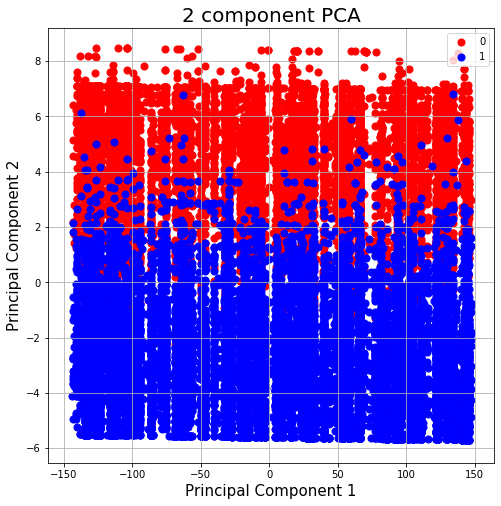

In [77]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1]
colors = ['r', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['recommended'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

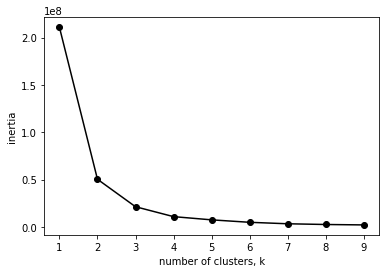

In [78]:
from sklearn.cluster import KMeans

ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(principalDf.iloc[:,:3])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()